<a href="https://colab.research.google.com/github/sainthm/MGS_AI_DS/blob/main/team2_crawlling_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 배틀그라운드의 흥망성쇠

In [38]:
# 라이브러리 사용
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
from datetime import datetime
import plotly.express as px
import requests
import json
import time
from pandas.io.json import json_normalize
from bs4 import BeautifulSoup as bs4
from datetime import datetime
from time import ctime
import datetime

# matplotlib.rcParams['font family'] = 'Malgun Gothic' # windows
matplotlib.rcParams['font.family'] = 'AppleGothic'
matplotlib.rcParams['font.size'] = 15
matplotlib.rcParams['axes.unicode_minus'] = False

## index
1. 전반적인 게임 업계 소개
2. 배틀그라운드에 대한 간략한 소개
3. 글로벌 배틀그라운드(스팀 플랫폼), 국내 배틀그라운드(카카오 플랫폼) 소개
4. EDA 프로세스 소개
5. 결론
6. Q&A

## 1. 전반적인 게임 업계 소개
- 내용

> 들여쓴 블록



## 2. 배틀그라운드에 대한 간략한 소개
- 프로젝트 메인 주제: 배틀그라운드

## 3. 글로벌 배틀그라운드(스팀 플랫폼), 국내 배틀그라운드((현) 다음 플랫폼, (구) 카카오 배그) 소개
- 내용

## 4. EDA 프로세스 소개
- 글로벌 데이터(스팀 플랫폼)
  - 동시 접속자 변화
  - 피크 접속자 변화
  - 게임 리뷰 데이터 변화
  - 게임 가격 변동치
  - 이용제한 현황(계정 블럭)


- 국내 데이터(다음 플랫폼)
  - 피시방 점유율 변동치  
  - 국내 유튜버 데이터 변동치
  - 이용제한 현황(계정 블럭)

In [2]:
# csv file import
# 데이터 확인 - 1
# 동시 접속자 변화
## lifetime_concurrent = ltc
ltc = pd.read_csv('./project1/lifetime_concurrent_players_chart.csv', sep =',')
ltc.head(5)

,DateTime,Players,Twitch Viewers,Flags
0,2016-09-09 00:00:00,NaN,40509,NaN
1,2016-09-10 00:00:00,NaN,9690,NaN
2,2016-09-11 00:00:00,NaN,0,NaN
3,2016-09-12 00:00:00,NaN,1,NaN
4,2016-09-13 00:00:00,NaN,22,NaN


In [3]:
# 필요없는 columns 삭제
# ltc = ltc.drop('Flags', axis=1)
# df = df.drop('Flags', axis=1)
ltc.head(5)

,DateTime,Players,Twitch Viewers,Flags
0,2016-09-09 00:00:00,NaN,40509,NaN
1,2016-09-10 00:00:00,NaN,9690,NaN
2,2016-09-11 00:00:00,NaN,0,NaN
3,2016-09-12 00:00:00,NaN,1,NaN
4,2016-09-13 00:00:00,NaN,22,NaN


In [4]:
# 데이터 확인 - 2
# twitch 시청자수 describe
ltc['Twitch Viewers'].describe()

count      2197.000000
mean      67002.246245
std       51564.030380
min           0.000000
25%       33983.000000
50%       53743.000000
75%       93985.000000
max      597309.000000
Name: Twitch Viewers, dtype: float64

In [5]:
# ltc 전처리 - 1
df = pd.read_csv('./project1/lifetime_concurrent_players_chart.csv', sep =',')
ltc.head(5)

,DateTime,Players,Twitch Viewers,Flags
0,2016-09-09 00:00:00,NaN,40509,NaN
1,2016-09-10 00:00:00,NaN,9690,NaN
2,2016-09-11 00:00:00,NaN,0,NaN
3,2016-09-12 00:00:00,NaN,1,NaN
4,2016-09-13 00:00:00,NaN,22,NaN


In [6]:
# ltc 전처리 - 2

ltc_df = df.groupby('DateTime').Players.sum().reset_index()
ltc_df

,DateTime,Players
0,2016-09-09 00:00:00,0.0
1,2016-09-10 00:00:00,0.0
2,2016-09-11 00:00:00,0.0
3,2016-09-12 00:00:00,0.0
4,2016-09-13 00:00:00,0.0
...,...,...
2192,2022-09-10 00:00:00,412853.0
2193,2022-09-11 00:00:00,442131.0
2194,2022-09-12 00:00:00,423516.0
2195,2022-09-13 00:00:00,425046.0


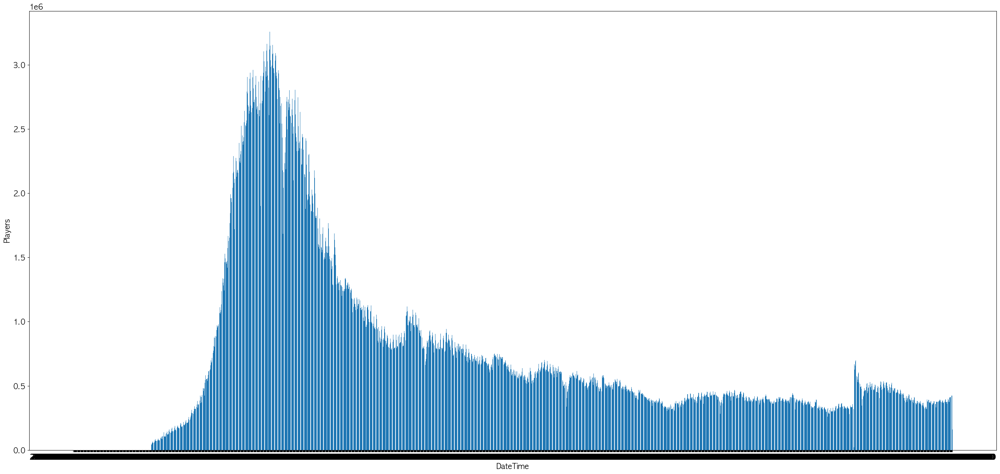

In [7]:
# 데이터 시각화
# lifetime concurrent
# plt bar
plt.figure(figsize=(35, 16))
plt.bar(ltc_df['DateTime'], ltc_df['Players'])
plt.ylabel('Players')
plt.xlabel('DateTime')
plt.show()


In [8]:
# 데이터 시각화
# lifetime concurrent
# Time Series and Date Axes in Python
fig = px.line(ltc_df, x='DateTime', y="Players")
fig.show()


In [9]:
# 트위치 시청자수 데이터 활용
df.rename(columns = {'Twitch Viewers' : 'TwitchViewers'}, inplace = True)
lt_twitch_df = df.groupby('DateTime').TwitchViewers.sum().reset_index()
lt_twitch_df

,DateTime,TwitchViewers
0,2016-09-09 00:00:00,40509
1,2016-09-10 00:00:00,9690
2,2016-09-11 00:00:00,0
3,2016-09-12 00:00:00,1
4,2016-09-13 00:00:00,22
...,...,...
2192,2022-09-10 00:00:00,30037
2193,2022-09-11 00:00:00,31689
2194,2022-09-12 00:00:00,23365
2195,2022-09-13 00:00:00,25821


In [10]:
# 데이터 시각화
# 트위치 시청자수 데이터 활용
# Time Series and Date Axes in Python
fig = px.line(df, x='DateTime', y="TwitchViewers")
fig.show()

In [11]:
# df = df.drop('Flags', axis=1)
df.columns

Index(['DateTime', 'Players', 'TwitchViewers', 'Flags'], dtype='object')

In [12]:
# 데이터 시각화
# 트위치 시청자수 데이터 활용
# Time Series and Date Axes in Python
fig = px.line(df, x='DateTime', y=df.columns)
fig.show()

In [13]:
# 스팀 게임 비교 - 1
# 2018년 전후 출시된 대작 스팀 게임 10개와 비교 (시리즈 게임 포함)
df_steam_2018_epic = pd.read_csv('./project1/steam_10_2018_epic_games_compare(lt).csv', sep =',')
df_steam_2018_epic.head(5)


,DateTime,Counter-Strike: Global Offensive,Sid Meier's Civilization V,Grand Theft Auto V,Sid Meier's Civilization VI,The Elder Scrolls V: Skyrim Special Edition,Far Cry 5,PUBG: BATTLEGROUNDS,Monster Hunter: World,Assassin's Creed Odyssey,太吾绘卷 The Scroll Of Taiwu
0,2010-09-20 00:00:00,NaN,18411.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2010-09-21 00:00:00,NaN,39886.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2010-09-22 00:00:00,NaN,38495.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2010-09-23 00:00:00,NaN,53585.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2010-09-24 00:00:00,NaN,68809.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [14]:
# 스팀 게임 비교 - 전처리
# 2018년 전후 출시된 대작 스팀 게임 10개와 비교 (시리즈 게임 포함)

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2197 entries, 0 to 2196
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   DateTime       2197 non-null   object 
 1   Players        2007 non-null   float64
 2   TwitchViewers  2197 non-null   int64  
 3   Flags          0 non-null      float64
dtypes: float64(2), int64(1), object(1)
memory usage: 68.8+ KB


In [15]:
# 스팀 게임 비교 - 전처리
# 2018년 전후 출시된 대작 스팀 게임 10개와 비교 (시리즈 게임 포함)

df_steam_2018_epic.columns

Index(['DateTime', 'Counter-Strike: Global Offensive',
       'Sid Meier's Civilization V', 'Grand Theft Auto V',
       'Sid Meier's Civilization VI',
       'The Elder Scrolls V: Skyrim Special Edition', 'Far Cry 5',
       'PUBG: BATTLEGROUNDS', 'Monster Hunter: World',
       'Assassin's Creed Odyssey', '太吾绘卷 The Scroll Of Taiwu'],
      dtype='object')

In [16]:
# 스팀 게임 비교 - 전처리
# 2018년 전후 출시된 대작 스팀 게임 10개와 비교 (시리즈 게임 포함)

df_steam_2018_epic.tail(5)


,DateTime,Counter-Strike: Global Offensive,Sid Meier's Civilization V,Grand Theft Auto V,Sid Meier's Civilization VI,The Elder Scrolls V: Skyrim Special Edition,Far Cry 5,PUBG: BATTLEGROUNDS,Monster Hunter: World,Assassin's Creed Odyssey,太吾绘卷 The Scroll Of Taiwu
4372,2022-09-09 00:00:00,1016382.0,18943.0,155840.0,51257.0,23388.0,2491.0,413251.0,21147.0,4662.0,2107.0
4373,2022-09-10 00:00:00,1029224.0,21916.0,167797.0,60402.0,28735.0,2850.0,412853.0,22166.0,5413.0,2335.0
4374,2022-09-11 00:00:00,1062931.0,23140.0,173700.0,62665.0,31480.0,3080.0,442131.0,22699.0,6215.0,2462.0
4375,2022-09-12 00:00:00,943540.0,18678.0,142430.0,46503.0,24080.0,2183.0,423516.0,20228.0,4664.0,2539.0
4376,2022-09-13 00:00:00,932805.0,17984.0,140061.0,45390.0,22513.0,2185.0,425046.0,19701.0,4691.0,2481.0


In [17]:
# 2018년 전후 출시된 대작 스팀 게임 10개와 비교 (시리즈 게임 포함)
row_num = range(4377)
col = ["Counter-Strike: Global Offensive", "Sid Meier's Civilization V", "Grand Theft Auto V", "Sid Meier's Civilization VI", "The Elder Scrolls V: Skyrim Special Edition", "Far Cry 5", "PUBG: BATTLEGROUNDS", "Monster Hunter: World", "Assassin's Creed Odyssey", "太吾绘卷 The Scroll Of Taiwu"]

df_steam_2018_epic["PUBG: BATTLEGROUNDS"]

0            NaN
1            NaN
2            NaN
3            NaN
4            NaN
          ...   
4372    413251.0
4373    412853.0
4374    442131.0
4375    423516.0
4376    425046.0
Name: PUBG: BATTLEGROUNDS, Length: 4377, dtype: float64

In [18]:
# 2018년 전후 출시된 대작 스팀 게임 10개와 비교 (시리즈 게임 포함)
# 하나의 데이터프레임으로 합치기 위한 작업
for y in row_num:
    for x in col:
        df_steam_2018_epic_vis = df_steam_2018_epic[x][y]
        

In [19]:
# 2018년 전후 출시된 대작 스팀 게임 10개와 비교 (시리즈 게임 포함)
df_steam_2018_epic.columns

Index(['DateTime', 'Counter-Strike: Global Offensive',
       'Sid Meier's Civilization V', 'Grand Theft Auto V',
       'Sid Meier's Civilization VI',
       'The Elder Scrolls V: Skyrim Special Edition', 'Far Cry 5',
       'PUBG: BATTLEGROUNDS', 'Monster Hunter: World',
       'Assassin's Creed Odyssey', '太吾绘卷 The Scroll Of Taiwu'],
      dtype='object')

In [20]:
# 데이터 시각화
# 2018년 전후 출시된 대작 스팀 게임 10개와 비교 (시리즈 게임 포함)
plt.figure(figsize=(35, 16))
fig = px.line(df_steam_2018_epic, x="DateTime", y=["Counter-Strike: Global Offensive", "Sid Meier's Civilization V", "Grand Theft Auto V", "Sid Meier's Civilization VI", "The Elder Scrolls V: Skyrim Special Edition", "Far Cry 5", "PUBG: BATTLEGROUNDS", "Monster Hunter: World", "Assassin's Creed Odyssey", "太吾绘卷 The Scroll Of Taiwu"])
fig.show()

<Figure size 3500x1600 with 0 Axes>

In [21]:
# 현재 스팀에서 판매중인 배틀로얄 장르 Top10(All-Time peak 기준) 동시 접속자수 분석
df_steam_battle_royale_top_10 = pd.read_csv('./project1/steam_10_battle_royale_compare(lt).csv', sep =',')
df_steam_battle_royale_top_10.head(5)

,DateTime,Geneshift,Z1 Battle Royale,PUBG: BATTLEGROUNDS,Ring of Elysium,Realm Royale Reforged,Fall Guys,Apex Legends,NARAKA: BLADEPOINT,Battlefield™ V,Crab Game
0,2016-02-01 00:00:00,NaN,20916.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2016-02-02 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2016-02-03 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2016-02-04 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2016-02-05 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [22]:
# 현재 스팀에서 판매중인 배틀로얄 장르 Top10(All-Time peak 기준) 동시 접속자수 분석
# column 확인
df_steam_battle_royale_top_10.columns

Index(['DateTime', 'Geneshift', 'Z1 Battle Royale', 'PUBG: BATTLEGROUNDS',
       'Ring of Elysium', 'Realm Royale Reforged', 'Fall Guys', 'Apex Legends',
       'NARAKA: BLADEPOINT', 'Battlefield™ V', 'Crab Game'],
      dtype='object')

In [23]:
# 데이터 시각화
# 현재 스팀에서 판매중인 배틀로얄 장르 Top10(All-Time peak 기준) 동시 접속자수 분석
plt.figure(figsize=(35, 16))
fig = px.line(df_steam_battle_royale_top_10, x="DateTime", y=['Geneshift', 'Z1 Battle Royale', 'PUBG: BATTLEGROUNDS', 'Ring of Elysium', 'Realm Royale Reforged', 'Fall Guys', 'Apex Legends', 'NARAKA: BLADEPOINT', 'Battlefield™ V', 'Crab Game'])
fig.show()

<Figure size 3500x1600 with 0 Axes>

# 내일 할일:
### 0. 데이터 취합
### 1. 배그 vs 포트나이트 
### 2. 스팀 이용제한 수 찾아서 정리 (어려우면 3번으로 이동)
### 3. 카카오 이용제한 링크에서 데이터 추출
### 4. 결론 내기

In [63]:
# 포트나이트 비교
# URL List:
# https://www.statista.com/statistics/746230/fortnite-players/
# https://culturedvultures.com/wp-content/uploads/2019/11/Fortnite-revenue.jpg
# https://trends.edison.tech/research/fortnite-sales-19.html
# https://trends.edison.tech/assets/img/chart-gaming-1.png
# https://www.gamespot.com/articles/fortnite-just-passed-a-wild-new-player-milestone/1100-6463145/


In [24]:
#게임 리뷰 시계열 데이터 url, requests
url = 'https://store.steampowered.com/appreviewhistogram/578080?l=koreana&review_score_preference=0'
header = {
    'referer': 'https://store.steampowered.com/app/578080/PUBG_BATTLEGROUNDS/',
    'user-agent': 'Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_7) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/105.0.0.0 Safari/537.36'
#     'user-agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/105.0.0.0 Safari/537.36'
}
resp = requests.get(url, headers = header)

In [25]:
#게임 리뷰 시계열 데이터 json
data_gr = resp.json()['results']['rollups']
data_gr

[{'date': 1488326400,
  'recommendations_up': 5954,
  'recommendations_down': 2901},
 {'date': 1491004800,
  'recommendations_up': 12934,
  'recommendations_down': 6167},
 {'date': 1493596800,
  'recommendations_up': 11751,
  'recommendations_down': 5161},
 {'date': 1496275200,
  'recommendations_up': 14753,
  'recommendations_down': 5481},
 {'date': 1498867200,
  'recommendations_up': 19215,
  'recommendations_down': 9263},
 {'date': 1501545600,
  'recommendations_up': 24984,
  'recommendations_down': 14856},
 {'date': 1504224000,
  'recommendations_up': 30908,
  'recommendations_down': 21558},
 {'date': 1506816000,
  'recommendations_up': 38146,
  'recommendations_down': 65643},
 {'date': 1509494400,
  'recommendations_up': 82333,
  'recommendations_down': 39955},
 {'date': 1512086400,
  'recommendations_up': 40583,
  'recommendations_down': 49928},
 {'date': 1514764800,
  'recommendations_up': 31767,
  'recommendations_down': 31537},
 {'date': 1517443200,
  'recommendations_up': 209

In [26]:
#게임 리뷰 시계열 데이터 data frame
df = pd.DataFrame(data_gr)
df

,date,recommendations_up,recommendations_down
0,1488326400,5954,2901
1,1491004800,12934,6167
2,1493596800,11751,5161
3,1496275200,14753,5481
4,1498867200,19215,9263
...,...,...,...
62,1651363200,11112,5712
63,1654041600,10341,5659
64,1656633600,11093,6068
65,1659312000,10744,5402


In [27]:
#게임 리뷰 데이터 확인
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67 entries, 0 to 66
Data columns (total 3 columns):
 #   Column                Non-Null Count  Dtype
---  ------                --------------  -----
 0   date                  67 non-null     int64
 1   recommendations_up    67 non-null     int64
 2   recommendations_down  67 non-null     int64
dtypes: int64(3)
memory usage: 1.7 KB


In [28]:
# 게임 리뷰 데이터 정보를 가공
for i in range(0, 67):
    df['date'][i] = datetime.date.fromtimestamp(df['date'][i])
    
    
df

,date,recommendations_up,recommendations_down
0,2017-03-01,5954,2901
1,2017-04-01,12934,6167
2,2017-05-01,11751,5161
3,2017-06-01,14753,5481
4,2017-07-01,19215,9263
...,...,...,...
62,2022-05-01,11112,5712
63,2022-06-01,10341,5659
64,2022-07-01,11093,6068
65,2022-08-01,10744,5402


<function matplotlib.pyplot.show(close=None, block=None)>

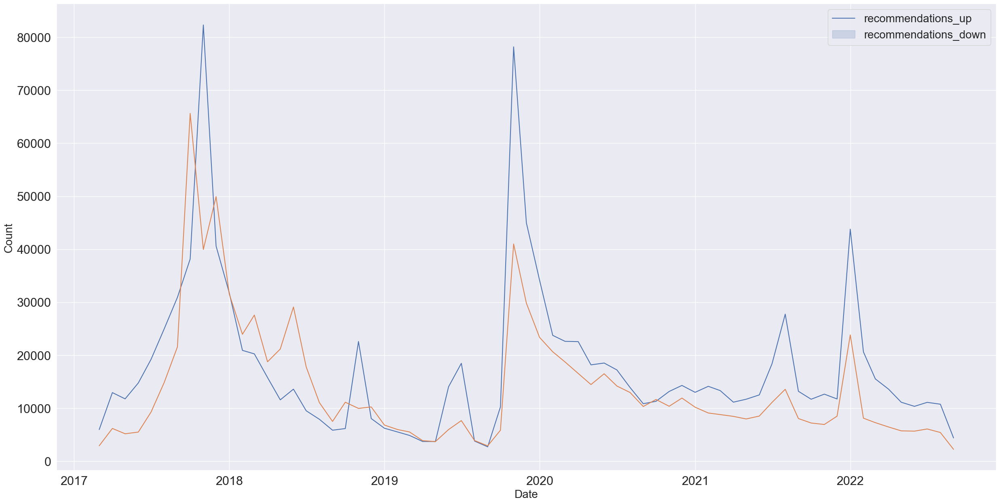

In [29]:
# 게임 리뷰 데이터 시각화
plt.figure(figsize = (30,15))
sns.set(font_scale=2)


sns.lineplot(data=df, x='date', y='recommendations_up')


sns.lineplot(data=df, x='date', y='recommendations_down')


plt.legend(labels = ['recommendations_up', 'recommendations_down'], fontsize=20)
plt.xlabel('Date', fontsize=20)
plt.ylabel('Count', fontsize=20)
plt.show

In [39]:
'''
게임 가격 변화
lifetime_price = lpc
병합시 file_path 수정 필요
'''

lpc = pd.read_csv('./mini_project/lifetime_price_chart.csv', sep =',')

# NaN값 0으로 채우기
lpc.fillna(0, inplace=True)

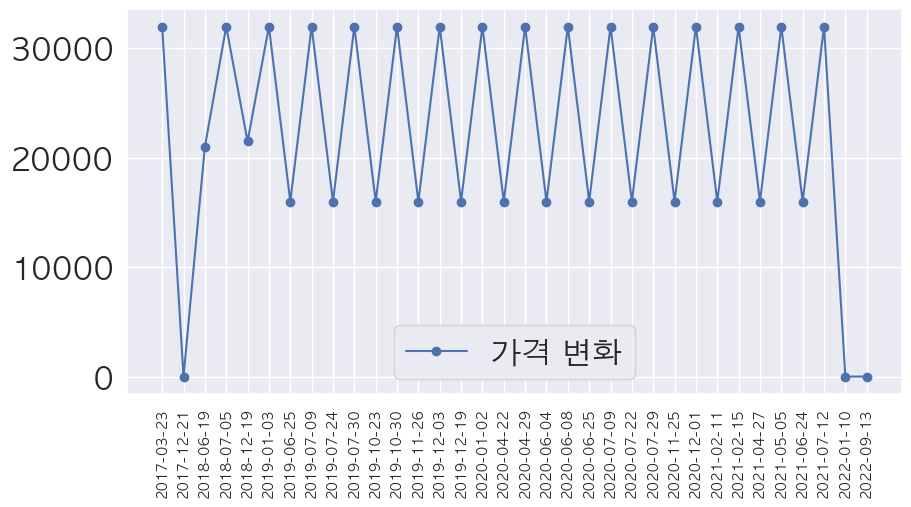

In [40]:
'''
차트에 그려질 x, y 축 값 변수로 저장
x 축 데이터에 시간 정보 제거후 날짜값만 리스트로 저장
'''

x = [date.split(' ')[0] for date in lpc['DateTime']]
y = lpc['Final price']

# 차트 크기 조절
plt.figure(figsize=(10, 5))

# 차트 그리기 
plt.plot(x, y, marker='o', label='가격 변화')

# 범례설정
plt.legend()

# 축 텍스트 45도로 회전 및 텍스트 크기 줄이기
plt.xticks(rotation=90, fontsize=10)

# 불필요한 텍스트 제거 (그래프만 표시)
plt.show()

In [41]:
'''
pc방 점유율 변화
pc_room_share = prs
병합시 file_path 수정 필요
'''

# 데이터 불러오기
prs = pd.read_excel('./mini_project/pc_room_share_chart_1.xlsx', skiprows=[0])
prs

,date,rank,use_time,percent,use_tiem_previous_week
0,2019년 1월 1주,2,6955501,19.30,-2.3
1,2019년 1월 2주,2,6450853,19.80,-7.3
2,2019년 1월 3주,2,6399365,19.80,-0.8
3,2019년 1월 4주,2,6264674,18.90,-2.1
4,2019년 1월 5주,2,6211473,17.30,-0.8
...,...,...,...,...,...
133,2021년 8월 4주,3,1126751,7.28,-6.3
134,2021년 9월 1주,3,1049311,6.88,-6.9
135,2021년 9월 2주,3,1001337,6.66,-4.9
136,2021년 9월 3주,4,1066526,6.63,6.5


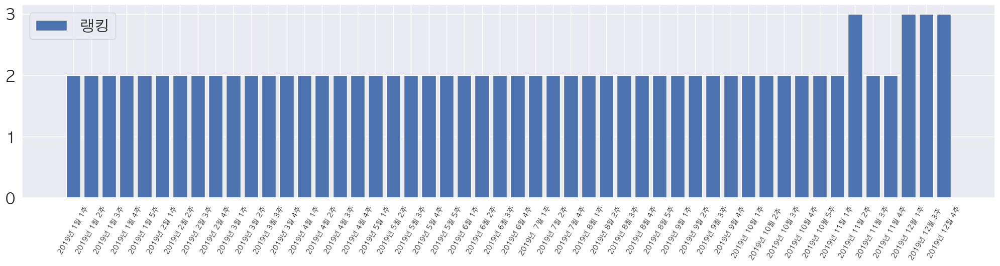

In [42]:
def drow_rank_chart(year):
    ''' 년도 입력을 받아 해당 년도의 정보만 가져와 랭킹 차트를 그리는 함수 '''
    
    # 입력 받은 년도정보만 가져오기
    date = prs[prs['date'].str.contains(str(year))]

    # 차트 크기 조절
    plt.figure(figsize=(25, 5))
    
    # 차트 그리기
    plt.bar(date['date'], date['rank'], label='랭킹')
    
    # x축 글자 60도 회전 시키기 및 글자 사이즈 조절
    plt.xticks(rotation=60, fontsize=10)
    
    # 범례
    plt.legend()
    plt.show()
    
drow_rank_chart(2019)

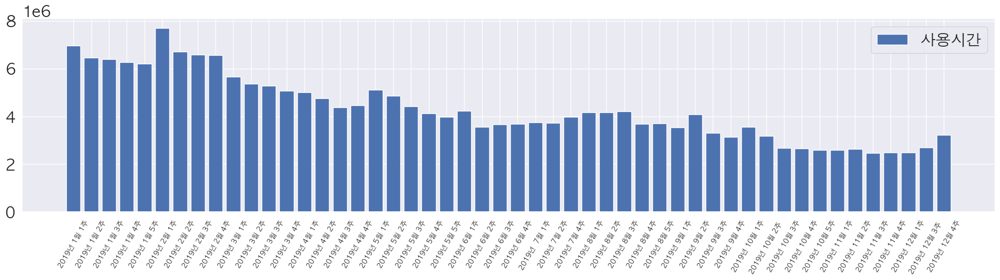

In [43]:
def drow_use_time_chart(year):
    ''' 년도 입력을 받아 해당 년도의 정보만 가져와 사용시간 차트를 그리는 함수 '''
    
    # 입력 받은 년도정보만 가져오기
    date = prs[prs['date'].str.contains(str(year))]

    # 차트 크기 조절
    plt.figure(figsize=(25, 5))
    
    # 차트 그리기
    plt.bar(date['date'], date['use_time'], label='사용시간')
    
    # x축 글자 60도 회전 시키기 및 글자 사이즈 조절
    plt.xticks(rotation=60, fontsize=10)
    
    # 범례
    plt.legend()
    plt.show()
    
drow_use_time_chart(2019)

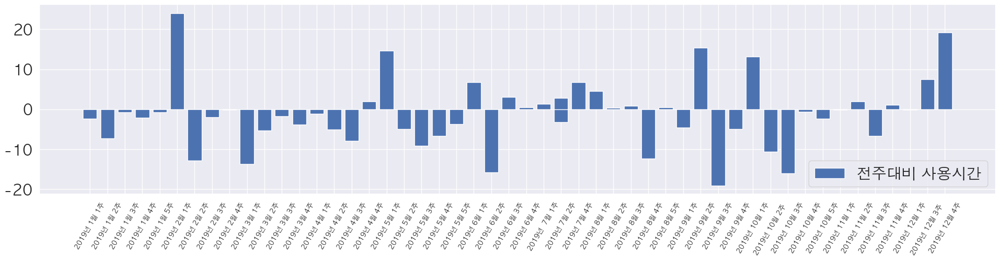

In [45]:
def drow_utpw_chart(year):
    ''' 년도 입력을 받아 해당 년도의 정보만 가져와 전주대비 사용시간 차트를 그리는 함수 '''
    
    # 입력 받은 년도정보만 가져오기
    date = prs[prs['date'].str.contains(str(year))]

    # 차트 크기 조절
    plt.figure(figsize=(25, 5))
    
    # 차트 그리기
    plt.bar(date['date'], date['use_tiem_previous_week'], label='전주대비 사용시간')
    
    # x축 글자 60도 회전 시키기 및 글자 사이즈 조절
    plt.xticks(rotation=60, fontsize=10)
    
    # 범례
    plt.legend()
    plt.show()
    
drow_utpw_chart(2019)


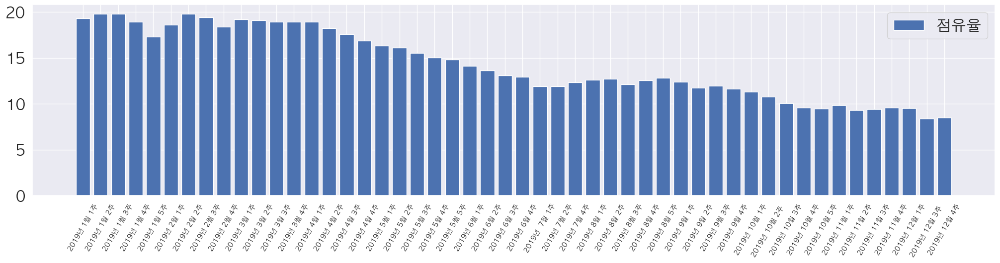

In [46]:
def drow_percent_chart(year):
    ''' 년도 입력을 받아 해당 년도의 정보만 가져와 점유율 차트를 그리는 함수 '''
    
    # 입력 받은 년도정보만 가져오기
    date = prs[prs['date'].str.contains(str(year))]

    # 차트 크기 조절
    plt.figure(figsize=(25, 5))
    
    # 차트 그리기
    plt.bar(date['date'], date['percent'], label='점유율')
    
    # x축 글자 60도 회전 시키기 및 글자 사이즈 조절
    plt.xticks(rotation=60, fontsize=10)
    
    # 범례
    plt.legend()
    plt.show()
    
drow_percent_chart(2019)


In [67]:
# 게임 가격 변화 및 PC방 차트 고도화를 위한 함수 정의

def drow_price_chart(ymd_list):
    ''' 
    게임 가격 변화 그래프 그리는 함수 
    인자로 년도 전달(text list 형식)
    '''
    
    # 데이터 프레임 생성
    # 병합시 file_path 수정 필요
    # 데이터 출처: https://steamdb.info/app/578080/ 에 price history
    df = pd.read_csv('./mini_project/lifetime_price_chart_2.csv', sep =',')
    
    # NaN값 0으로 채우기
    df.fillna(0, inplace=True)
        
    # join함수를 이용하여 이어주고 contains 함수에 넣기
    ymd = '|'.join(ymd_list)
    df = df[df['DateTime'].str.contains(ymd)]
    
    # 차트에 그려질 x, y 축 값 변수로 저장
    # x 축 데이터에 시간 정보 제거후 날짜값만 리스트로 저장
    x = [date.split(' ')[0] for date in df['DateTime']]
    y = df['Final price']

    # 차트 크기 조절
    plt.figure(figsize=(25, 3))

    # 차트 그리기 
    plt.plot(x, y, marker='o', label='가격 변화')

    # 범례설정
    plt.legend()

    # 축 텍스트 60도로 회전 및 텍스트 크기 줄이기
    plt.xticks(rotation=60, fontsize=8)
    
    # 격자 생성
    plt.grid(linestyle='--', linewidth=0.3)

    # 불필요한 텍스트 제거 (그래프만 표시)
    plt.show()

def get_label(col):
    ''' 넘겨 받은 column 이름으로 label 만드는 함수 '''

    label_dict = {
        'rank': '랭킹', 
        'percent': '점유율', 
        'use_time': '사용시간',
        'use_tiem_prev_week':'전주대비 사용시간',
    }
    return label_dict[col]

def drow_pc_chart(**kwargs):
    ''' 
    pc방 차트 그리는 함수 
    
    년월주 리스트 (x축), 컬럼명(y축), 그래프 색상을 **kwargs 형식으로 전달
    '''
    
    # 데이터프레임 생성
    # 병합시 file_path 수정 필요
    # 데이터 출처: https://www.thelog.co.kr/report/reportList.do pc방 주간 리포트 
    df = pd.read_excel('./mini_project/pc_room_share_chart_2.xlsx', skiprows=[0])
    
    # 년월주 리스트
    ymw_list = kwargs['ymw_list']
    
    # 컬럼
    col = kwargs['col']
    
    # 라벨
    label = get_label(col)
    
    # 컬러
    color = kwargs['color']

    # 입력 받은 년월주 정보만 가져오기
    # join함수를 이용하여 이어주고 contains 함수에 넣기
    ymw = '|'.join(ymw_list)
    df = df[df['date'].str.contains(ymw)]

    # 차트 크기 조절
    plt.figure(figsize=(25, 3))

    # 차트 그리기
    plt.bar(df['date'], df[col], label=label, color=color, alpha=0.5)
    
    # x축 글자 60도 회전 시키기 및 글자 사이즈 조절
    plt.xticks(rotation=60, fontsize=10)
    
    # 격자 생성
    plt.grid(linestyle='--', linewidth=0.3)

    # 범례
    plt.legend()
    plt.show()

In [68]:
# 데이터 세분화

''' 
년월로 나누기 위한 리스트 목록 

가격 변화 그래프의 날짜와 x 축(날짜)과 비슷하게 맞추기 위한 분류

필요시 리스트로 만들어 사용가능
EX:) ['2019', 2020] // 19년도와 20년도 전체 데이터 가져오기
'''

_2019 = ['2019년 1월', '2019년 6월', '2019년 7월', '2019년 10월', '2019년 11월', '2019년 12월']
_2020 = ['2020년 1월', "2020년 4월", '2020년 6월', '2020년 7월', '2020년 11월', '2020년 12월']
_2021 = ['2021년 2월', '2021년 4월', '2021년 5월', '2021년 6월', '2021년 7월']
_2022 = ['2022년 1월', '2022년 9월']

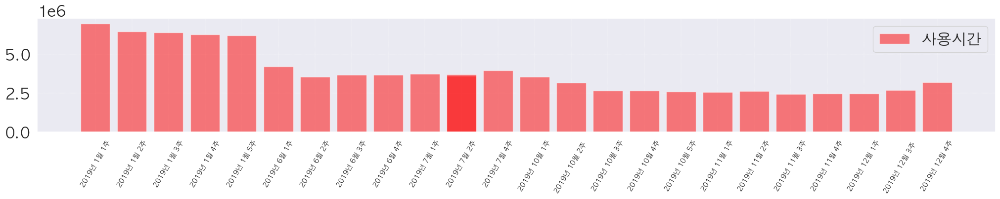

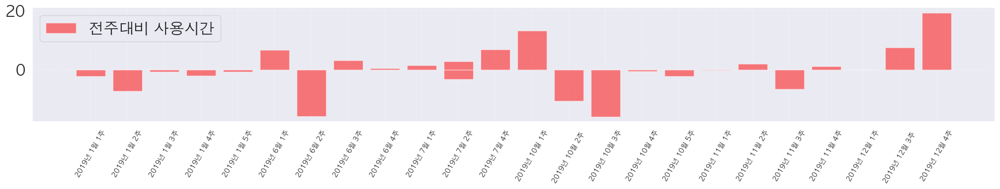

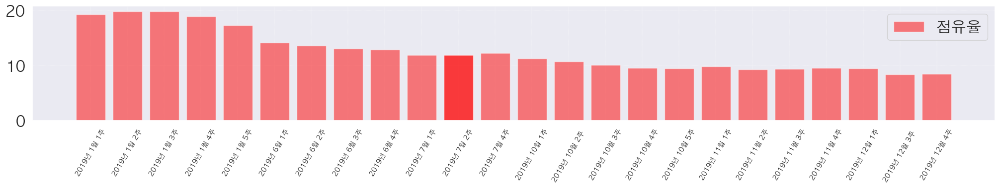

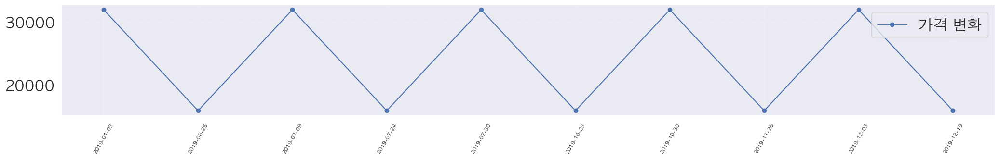

In [69]:
# 연도별 PC방 점유율, 사용시간, 전주대비 사용시간 차트 시각화

''' pc방 점유율 차트 그리기
    pc방 사용시간 차트 그리기
    pc방 전주대비 사용시간 차트 그리기 
    
    drow_price_chart() // 인자로 년월일 전달(text list 형식) 
    EX:) ['2019'] / [2019-01] / [2019-01-01]
    
    drow_pc_chart() // 인자로 년월주 리스트 (x축), 컬럼명(y축), 그래프 색상을 **kwargs 형식으로 전달
'''

# 2019년도 데이터 시각화
drow_pc_chart(ymw_list=_2019, col='use_time', color='red')
drow_pc_chart(ymw_list=_2019, col='use_tiem_prev_week', color='red')
drow_pc_chart(ymw_list=_2019, col='percent', color='red')
drow_price_chart(['2019'])


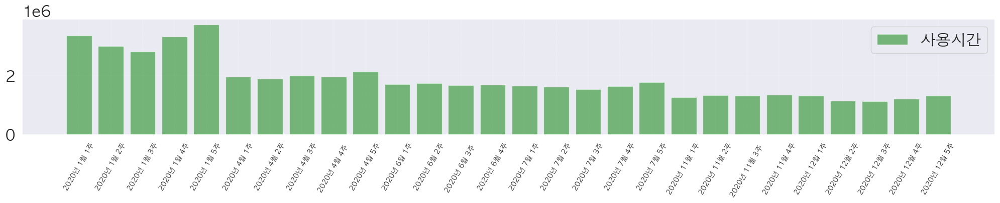

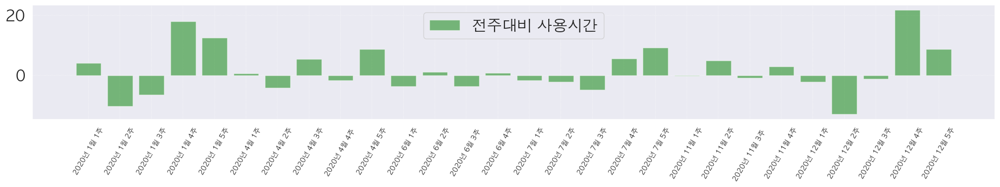

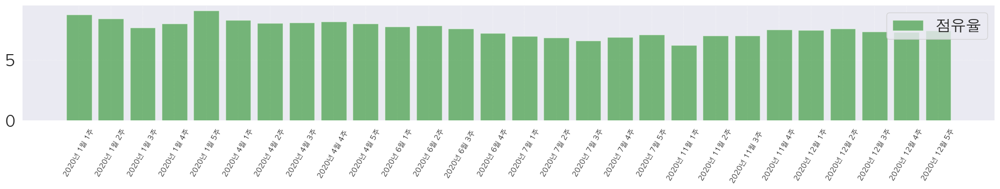

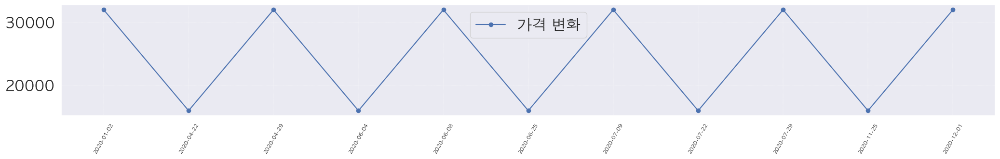

In [70]:
# 2020년도 데이터 시각화
drow_pc_chart(ymw_list=_2020, col='use_time', color='green')
drow_pc_chart(ymw_list=_2020, col='use_tiem_prev_week', color='green')
drow_pc_chart(ymw_list=_2020, col='percent', color='green')
drow_price_chart(['2020'])

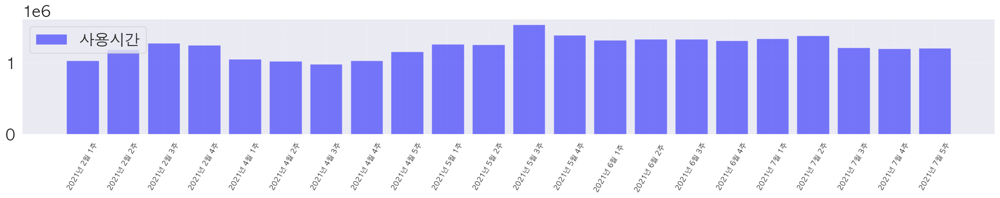

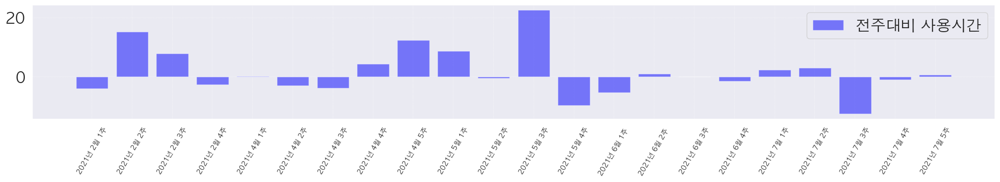

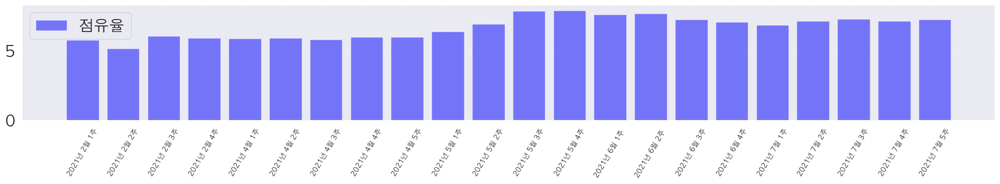

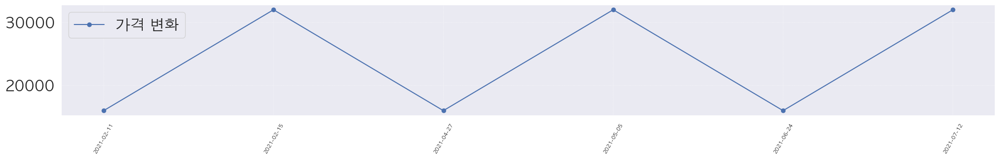

In [71]:
# 2021년도 데이터 시각화
drow_pc_chart(ymw_list=_2021, col='use_time', color='blue')
drow_pc_chart(ymw_list=_2021, col='use_tiem_prev_week', color='blue')
drow_pc_chart(ymw_list=_2021, col='percent', color='blue')
drow_price_chart(['2021'])

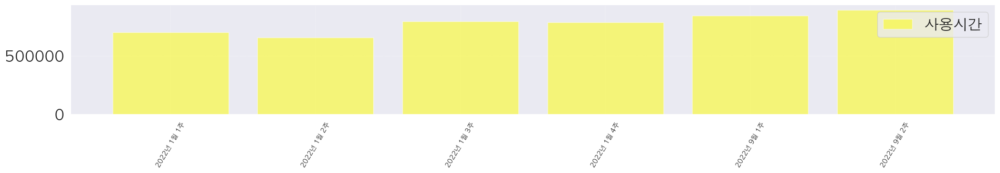

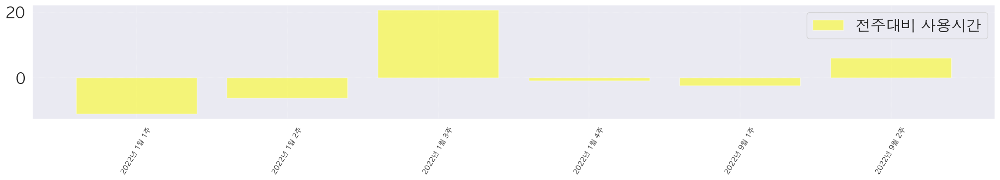

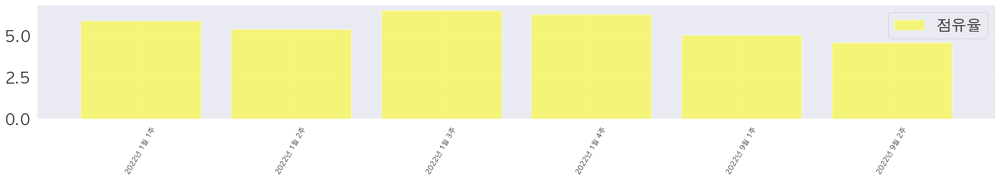

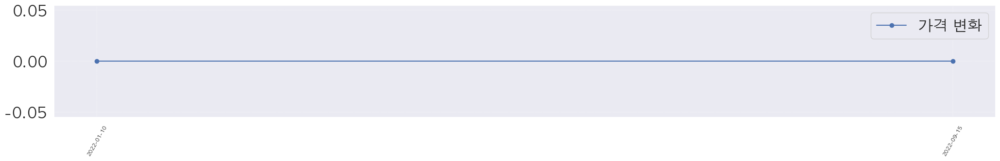

In [72]:
# 2022년도
drow_pc_chart(ymw_list=_2022, col='use_time', color='yellow')
drow_pc_chart(ymw_list=_2022, col='use_tiem_prev_week', color='yellow')
drow_pc_chart(ymw_list=_2022, col='percent', color='yellow')
drow_price_chart(['2022'])

## 5. 결론
- 내용

## 6. Q&A
- 내용